# InvertedPendulum-v1

Apply Deep Deterministic Policy Gradient (DDPG) from [Continuous Control with Deep Reinforcement Learning](https://arxiv.org/pdf/1509.02971.pdf) on InvertedPendulum-v1 environment from OpenAI Gym using TensorFlow.

## Dependencies
numpy==1.14.0<br>
mujoco_py==0.5.7 (Requires mjpro131 folder and license to properly setup the dependency)<br>
gym==0.9.3<br>
tensorflow-gpu==1.7.0<br>
JSAnimation (for testing animation)

# How to use
Install dependencies and Python 3 (I used version 3.5.2)<br>
Set **MODE = 'TRAIN'** to train or **MODE = 'TEST'** (in constants.py) to test with the model<br>
To run the program: **python main.py**<br>
An animation has been created in **InvertedPendulum-v1.ipynb** for testing an converged model on InvertedPendulum-v1

## Deep Deterministic Policy Gradient
DDPG follows the framework of Deep Reinforcement Learning with Actor Critic model.
### Actor Critic Model
Actor will take state as input and return action (Real values).
Critic will take the state and action from the Actor to evaluate the action (Q-value). A Critic is like a normal Deep Q Network (DQN) that I presented in class, but it take both state and action as input and output the state and action Q value.
### DDPG Framework
Randomly initialize critic network $Q(s, a|\theta^Q)$ and actor $\mu(s|\theta^\mu)$ with weights $\theta^Q$ and $\theta^\mu$.<br>
Initialize target network $Q'$ and $\mu'$ with weights $\theta^{Q'} \leftarrow \theta^Q$, $\theta^{\mu'} \leftarrow \theta^\mu$<br>
Initialize replay buffer R<br>
**for** episode = 1, M **do**<br>
&nbsp;&nbsp;Initialize a random process $\mathcal{N}$ for action exploration<br>
&nbsp;&nbsp;Receive initial observation state $s_1$<br>
&nbsp;&nbsp;**for** t = 1, T **do**<br>
&nbsp;&nbsp;&nbsp;&nbsp;Select action $a_t = \mu(s_t|\theta\mu) + \mathcal{N}_t$ according to the current policy and exploration noise<br>
&nbsp;&nbsp;&nbsp;&nbsp;Execute action $a_t$ and observe reward $r_t$ and new state $s_{t+1}$<br>
&nbsp;&nbsp;&nbsp;&nbsp;Store transition ($s_t, a_t, r_t, s_{t+1}$) in R<br>
&nbsp;&nbsp;&nbsp;&nbsp;Sample a random minibatch of N transitions ($s_i, a_i, r_i, s_{i+1}$) from R<br>
&nbsp;&nbsp;&nbsp;&nbsp;Set $y_i = r_i + \gamma Q'(s_{i+1}, \mu'(s_{i+1}|\theta^{\mu'})|\theta^{Q'}$<br>
&nbsp;&nbsp;&nbsp;&nbsp;Update critic by minimize the loss:$$L = \frac{1}{N} \sum\nolimits_{i}(y_i − Q(s_i, a_i|\theta^Q))^2$$
&nbsp;&nbsp;&nbsp;&nbsp;Update the actor policy using the sampled policy gradient:$$\triangledown_{\theta^\mu}J \approx \frac{1}{N} \sum\limits_i \triangledown_a Q(s, a| \theta^Q)|_{s=s_i, a=\mu(s_i)} \triangledown_{\theta^\mu}\mu(s|\theta^\mu)|_{s_i}$$
&nbsp;&nbsp;&nbsp;&nbsp;Update the target networks:<br>
$$
\theta^{Q'} \leftarrow \tau \theta^Q + (1 - \tau)\theta^{Q'}
$$
$$
\theta^{\mu'} \leftarrow \tau \theta^\mu + (1 - \tau)\theta^{\mu'}
$$
&nbsp;&nbsp;**end for**<br>
**end for**

## Overall
1. The agent runs a certain steps to collect a good amount of data before training.<br>
2. Using DDPG to train the agent with Ornstein-Uhlenbeck noise on the action.<br>
3. Run simulation without adding noise on action for the agent and check the episode total reward.<br>
4. If the mean reward of 100 current episodes is greater than 995 (100 is the max step or reward) then the agent is considered well learned and save the model.<br>
5. Model for InvertedPendulum-v1 converged after roughly 2800 episodes.

## Reference
1. Lillicrap, Timothy P., et al. "Continuous control with deep reinforcement learning." arXiv preprint arXiv:1509.02971(2015).

In [1]:
%matplotlib inline
from JSAnimation.IPython_display import display_animation
from matplotlib import animation
import matplotlib.pyplot as plt
from IPython.display import display
from Env_Normalization import env_norm
from Agent import Agent
import gym
import numpy as np
import tensorflow as tf
import os.path
from constants import *

/home/gdao/anaconda3/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
env = env_norm(gym.make(ENV_NAME))
sess = tf.InteractiveSession()

agent = Agent(env, sess)

saver = tf.train.Saver()
tracker = [0.0]
MODE = 'TRAIN'
if MODE == 'TRAIN':
    '''Train'''
    print('Collecting data ...')
    for episode in range(EPISODES):
        state = env.reset()
        for step in range(env.spec.timestep_limit):
            action = agent.noise_action(state)
            next_state, reward, done, _ = env.step(action)
            agent.perceive(state, action, reward, next_state, done)
            state = next_state
            if done:
                break

        if agent.replay_buffer.count() > REPLAY_START:
            # Validation
            state = env.reset()
            for j in range(env.spec.timestep_limit): # env.spec.timestep_limit = 1000
                if agent.replay_buffer.count() > REPLAY_START and RENDER:
                    env.render()
                action = agent.action(state)
                state, reward, done, _ = env.step(action)
                tracker[-1] += reward
                if done:
                    # if agent.replay_buffer.count() > REPLAY_START and RENDER:
                    #     env.render(close=True)
                    break
            print('Episode: {}, Episode Validation Reward: {:.2f}'.format(episode, tracker[-1]))
            if np.mean(tracker[-100:]) > 995.0: # Model is stable
                print('Model is stable!')
                break
            tracker.append(0.0)

    print('Mean of Current 100 Episodes: {:.2f}'.format(np.mean(tracker[-100:])))
    save_path = saver.save(sess, './out/model.ckpt')
    print('Model is saved at %s' % save_path)
else:
    '''Test'''
    saver.restore(sess, './out/model.ckpt')
    frames = []
    state = env.reset()
    for j in range(env.spec.timestep_limit): # env.spec.timestep_limit = 1000
        frames.append(env.render(mode='rgb_array'))
        action = agent.action(state)
        state, reward, done, _ = env.step(action)
        tracker[-1] += reward
        if done:
            env.render(close=True)
            break
    print('Reward: {}'.format(tracker[-1]))


/home/gdao/anaconda3/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
[2018-04-30 21:13:50,714] Making new env: InvertedPendulum-v1
[2018-04-30 21:13:56,032] From /home/gdao/anaconda3/lib/python3.5/site-packages/tensorflow/contrib/learn/python/learn/datasets/base.py:198: retry (from tensorflow.contrib.learn.python.learn.datasets.base) is deprecated and will be removed in a future version.
Instructions for updating:
Use the retry module or similar alternatives.


Episode: 1535, Episode Validation Reward: 20.00
Episode: 1536, Episode Validation Reward: 18.00
Episode: 1537, Episode Validation Reward: 11.00
Episode: 1538, Episode Validation Reward: 7.00
Episode: 1539, Episode Validation Reward: 5.00
Episode: 1540, Episode Validation Reward: 5.00
Episode: 1541, Episode Validation Reward: 5.00
Episode: 1542, Episode Validation Reward: 5.00
Episode: 1543, Episode Validation Reward: 5.00
Episode: 1544, Episode Validation Reward: 5.00
Episode: 1545, Episode Validation Reward: 5.00
Episode: 1546, Episode Validation Reward: 5.00
Episode: 1547, Episode Validation Reward: 6.00
Episode: 1548, Episode Validation Reward: 6.00
Episode: 1549, Episode Validation Reward: 6.00
Episode: 1550, Episode Validation Reward: 6.00
Episode: 1551, Episode Validation Reward: 6.00
Episode: 1552, Episode Validation Reward: 6.00
Episode: 1553, Episode Validation Reward: 7.00
Episode: 1554, Episode Validation Reward: 6.00
Episode: 1555, Episode Validation Reward: 6.00
Episode: 1

Episode: 1711, Episode Validation Reward: 2.00
Episode: 1712, Episode Validation Reward: 2.00
Episode: 1713, Episode Validation Reward: 3.00
Episode: 1714, Episode Validation Reward: 3.00
Episode: 1715, Episode Validation Reward: 3.00
Episode: 1716, Episode Validation Reward: 2.00
Episode: 1717, Episode Validation Reward: 3.00
Episode: 1718, Episode Validation Reward: 3.00
Episode: 1719, Episode Validation Reward: 3.00
Episode: 1720, Episode Validation Reward: 2.00
Episode: 1721, Episode Validation Reward: 3.00
Episode: 1722, Episode Validation Reward: 2.00
Episode: 1723, Episode Validation Reward: 2.00
Episode: 1724, Episode Validation Reward: 3.00
Episode: 1725, Episode Validation Reward: 3.00
Episode: 1726, Episode Validation Reward: 2.00
Episode: 1727, Episode Validation Reward: 2.00
Episode: 1728, Episode Validation Reward: 2.00
Episode: 1729, Episode Validation Reward: 2.00
Episode: 1730, Episode Validation Reward: 3.00
Episode: 1731, Episode Validation Reward: 2.00
Episode: 1732

Episode: 1891, Episode Validation Reward: 3.00
Episode: 1892, Episode Validation Reward: 2.00
Episode: 1893, Episode Validation Reward: 3.00
Episode: 1894, Episode Validation Reward: 3.00
Episode: 1895, Episode Validation Reward: 3.00
Episode: 1896, Episode Validation Reward: 3.00
Episode: 1897, Episode Validation Reward: 3.00
Episode: 1898, Episode Validation Reward: 3.00
Episode: 1899, Episode Validation Reward: 2.00
Episode: 1900, Episode Validation Reward: 2.00
Episode: 1901, Episode Validation Reward: 3.00
Episode: 1902, Episode Validation Reward: 3.00
Episode: 1903, Episode Validation Reward: 3.00
Episode: 1904, Episode Validation Reward: 3.00
Episode: 1905, Episode Validation Reward: 2.00
Episode: 1906, Episode Validation Reward: 2.00
Episode: 1907, Episode Validation Reward: 3.00
Episode: 1908, Episode Validation Reward: 3.00
Episode: 1909, Episode Validation Reward: 3.00
Episode: 1910, Episode Validation Reward: 2.00
Episode: 1911, Episode Validation Reward: 2.00
Episode: 1912

Episode: 2064, Episode Validation Reward: 40.00
Episode: 2065, Episode Validation Reward: 49.00
Episode: 2066, Episode Validation Reward: 55.00
Episode: 2067, Episode Validation Reward: 59.00
Episode: 2068, Episode Validation Reward: 51.00
Episode: 2069, Episode Validation Reward: 55.00
Episode: 2070, Episode Validation Reward: 37.00
Episode: 2071, Episode Validation Reward: 51.00
Episode: 2072, Episode Validation Reward: 37.00
Episode: 2073, Episode Validation Reward: 42.00
Episode: 2074, Episode Validation Reward: 66.00
Episode: 2075, Episode Validation Reward: 65.00
Episode: 2076, Episode Validation Reward: 47.00
Episode: 2077, Episode Validation Reward: 127.00
Episode: 2078, Episode Validation Reward: 109.00
Episode: 2079, Episode Validation Reward: 99.00
Episode: 2080, Episode Validation Reward: 80.00
Episode: 2081, Episode Validation Reward: 187.00
Episode: 2082, Episode Validation Reward: 67.00
Episode: 2083, Episode Validation Reward: 52.00
Episode: 2084, Episode Validation Rew

Episode: 2235, Episode Validation Reward: 61.00
Episode: 2236, Episode Validation Reward: 59.00
Episode: 2237, Episode Validation Reward: 52.00
Episode: 2238, Episode Validation Reward: 65.00
Episode: 2239, Episode Validation Reward: 66.00
Episode: 2240, Episode Validation Reward: 71.00
Episode: 2241, Episode Validation Reward: 66.00
Episode: 2242, Episode Validation Reward: 74.00
Episode: 2243, Episode Validation Reward: 63.00
Episode: 2244, Episode Validation Reward: 56.00
Episode: 2245, Episode Validation Reward: 55.00
Episode: 2246, Episode Validation Reward: 71.00
Episode: 2247, Episode Validation Reward: 75.00
Episode: 2248, Episode Validation Reward: 63.00
Episode: 2249, Episode Validation Reward: 57.00
Episode: 2250, Episode Validation Reward: 71.00
Episode: 2251, Episode Validation Reward: 57.00
Episode: 2252, Episode Validation Reward: 64.00
Episode: 2253, Episode Validation Reward: 66.00
Episode: 2254, Episode Validation Reward: 71.00
Episode: 2255, Episode Validation Reward

Episode: 2406, Episode Validation Reward: 80.00
Episode: 2407, Episode Validation Reward: 66.00
Episode: 2408, Episode Validation Reward: 66.00
Episode: 2409, Episode Validation Reward: 60.00
Episode: 2410, Episode Validation Reward: 56.00
Episode: 2411, Episode Validation Reward: 64.00
Episode: 2412, Episode Validation Reward: 58.00
Episode: 2413, Episode Validation Reward: 49.00
Episode: 2414, Episode Validation Reward: 52.00
Episode: 2415, Episode Validation Reward: 67.00
Episode: 2416, Episode Validation Reward: 61.00
Episode: 2417, Episode Validation Reward: 54.00
Episode: 2418, Episode Validation Reward: 60.00
Episode: 2419, Episode Validation Reward: 58.00
Episode: 2420, Episode Validation Reward: 50.00
Episode: 2421, Episode Validation Reward: 57.00
Episode: 2422, Episode Validation Reward: 57.00
Episode: 2423, Episode Validation Reward: 55.00
Episode: 2424, Episode Validation Reward: 52.00
Episode: 2425, Episode Validation Reward: 52.00
Episode: 2426, Episode Validation Reward

Episode: 2575, Episode Validation Reward: 176.00
Episode: 2576, Episode Validation Reward: 161.00
Episode: 2577, Episode Validation Reward: 173.00
Episode: 2578, Episode Validation Reward: 221.00
Episode: 2579, Episode Validation Reward: 270.00
Episode: 2580, Episode Validation Reward: 280.00
Episode: 2581, Episode Validation Reward: 285.00
Episode: 2582, Episode Validation Reward: 295.00
Episode: 2583, Episode Validation Reward: 313.00
Episode: 2584, Episode Validation Reward: 311.00
Episode: 2585, Episode Validation Reward: 313.00
Episode: 2586, Episode Validation Reward: 249.00
Episode: 2587, Episode Validation Reward: 370.00
Episode: 2588, Episode Validation Reward: 297.00
Episode: 2589, Episode Validation Reward: 302.00
Episode: 2590, Episode Validation Reward: 419.00
Episode: 2591, Episode Validation Reward: 277.00
Episode: 2592, Episode Validation Reward: 1000.00
Episode: 2593, Episode Validation Reward: 558.00
Episode: 2594, Episode Validation Reward: 1000.00
Episode: 2595, Epi

In [2]:
tf.reset_default_graph()
env = env_norm(gym.make(ENV_NAME))
sess = tf.InteractiveSession()

agent = Agent(env, sess)

saver = tf.train.Saver()
tracker = [0.0]
MODE = 'TEST'
if MODE == 'TRAIN':
    '''Train'''
    print('Collecting data ...')
    for episode in range(EPISODES):
        state = env.reset()
        for step in range(env.spec.timestep_limit):
            action = agent.noise_action(state)
            next_state, reward, done, _ = env.step(action)
            agent.perceive(state, action, reward, next_state, done)
            state = next_state
            if done:
                break

        if agent.replay_buffer.count() > REPLAY_START:
            # Validation
            state = env.reset()
            for j in range(env.spec.timestep_limit): # env.spec.timestep_limit = 1000
                if agent.replay_buffer.count() > REPLAY_START and RENDER:
                    env.render()
                action = agent.action(state)
                state, reward, done, _ = env.step(action)
                tracker[-1] += reward
                if done:
                    # if agent.replay_buffer.count() > REPLAY_START and RENDER:
                    #     env.render(close=True)
                    break
            print('Episode: {}, Episode Validation Reward: {:.2f}'.format(episode, tracker[-1]))
            if np.mean(tracker[-100:]) > 995.0: # Model is stable
                print('Model is stable!')
                break
            tracker.append(0.0)

    print('Mean of Current 100 Episodes: {:.2f}'.format(np.mean(tracker[-100:])))
    save_path = saver.save(sess, './out/model.ckpt')
    print('Model is saved at %s' % save_path)
else:
    '''Test'''
    saver.restore(sess, './out/model.ckpt')
    frames = []
    state = env.reset()
    for j in range(env.spec.timestep_limit): # env.spec.timestep_limit = 1000
        frames.append(env.render(mode='rgb_array'))
        action = agent.action(state)
        state, reward, done, _ = env.step(action)
        tracker[-1] += reward
        if done:
            env.render(close=True)
            break
    print('Reward: {}'.format(tracker[-1]))

[2018-05-01 13:26:12,451] Making new env: InvertedPendulum-v1
[2018-05-01 13:26:17,298] From /home/gdao/anaconda3/lib/python3.5/site-packages/tensorflow/contrib/learn/python/learn/datasets/base.py:198: retry (from tensorflow.contrib.learn.python.learn.datasets.base) is deprecated and will be removed in a future version.
Instructions for updating:
Use the retry module or similar alternatives.


Reward: 1000.0



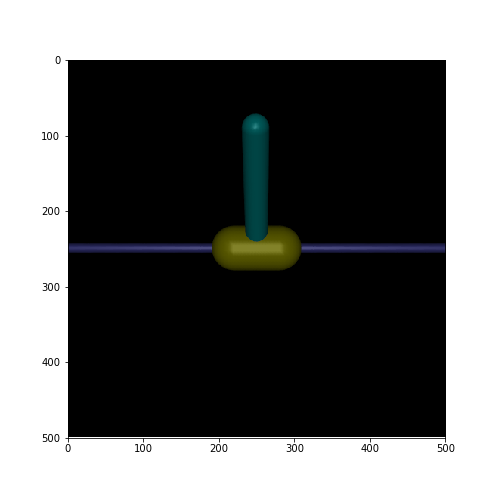
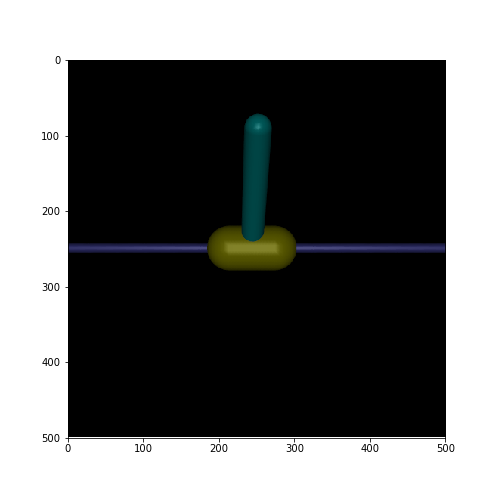
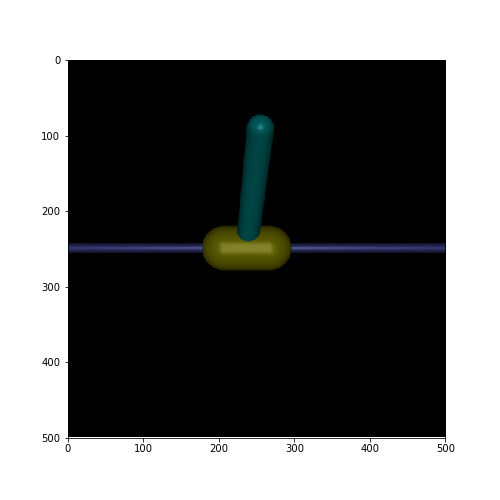
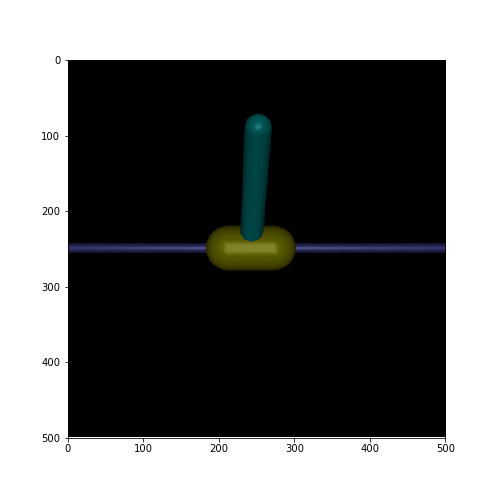
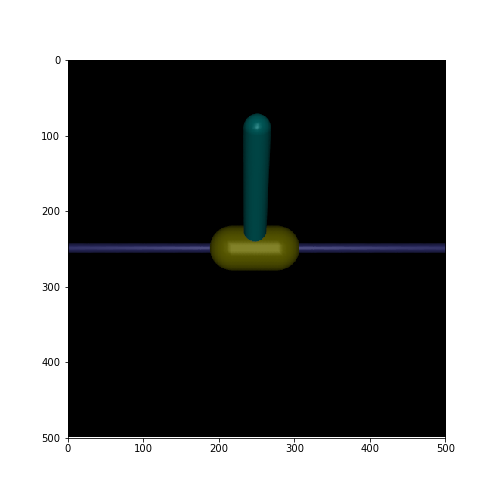
...
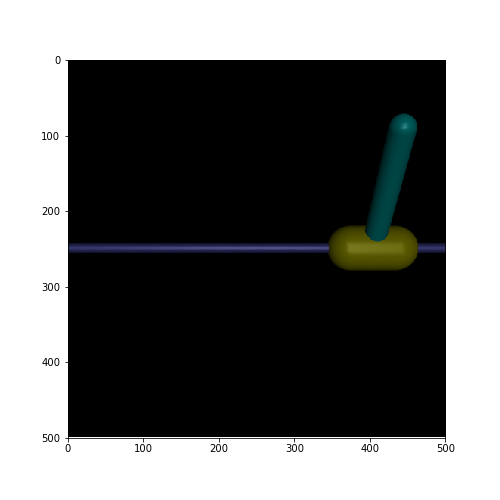
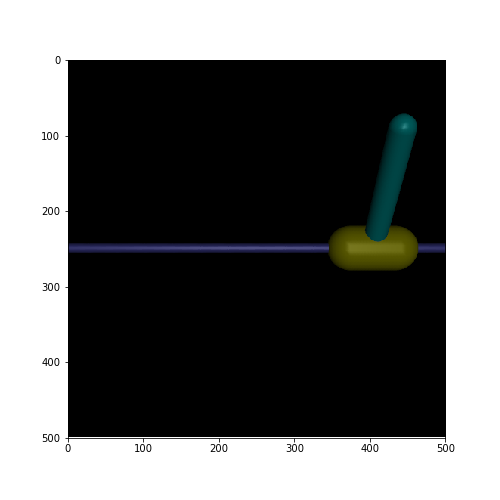
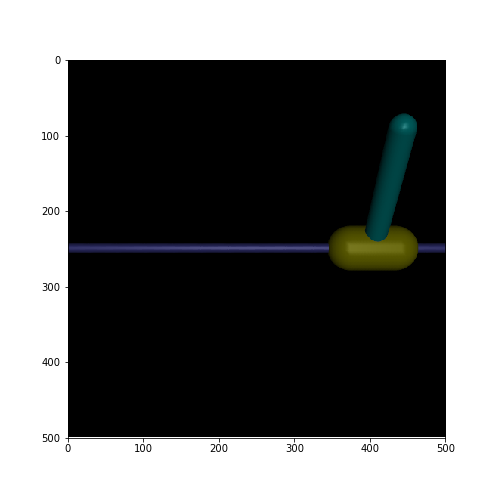
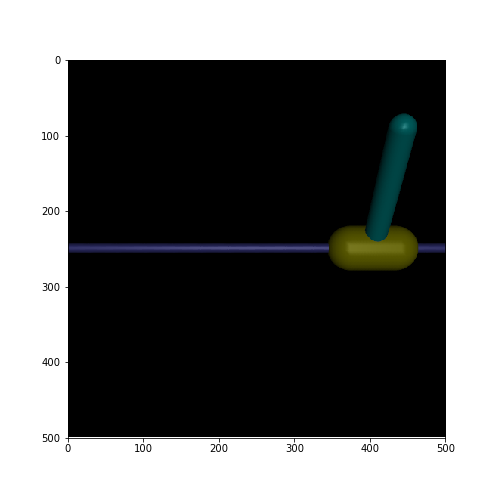
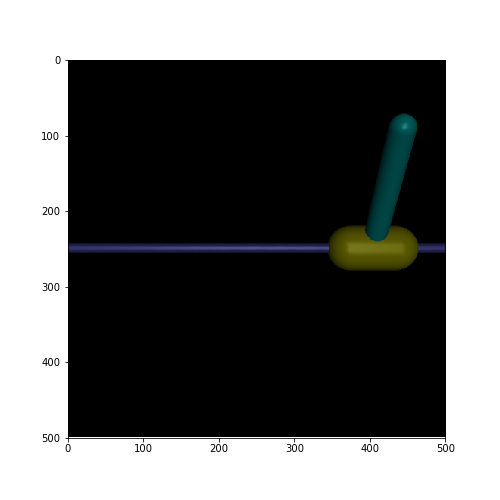

In [3]:
def display_frames_as_gif(frames):
    plt.figure(figsize=(frames[0].shape[1]/72.0, frames[0].shape[0]/72.0), dpi=72)
    patch = plt.imshow(frames[0])
    plt.axis=('off')
    
    def animate(i):
        patch.set_data(frames[i])
        
    anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
    display(display_animation(anim, default_mode='loop'))
    
display_frames_as_gif(frames)

<center> Click Right Triangle to play </center>